<a href="https://colab.research.google.com/github/jodysuseno/PraktikumML_073-076/blob/main/model/CornLeafDiseaseModelClassification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Inisialisasi

In [1]:
import numpy as np 
import matplotlib.pyplot as plt
import glob
import cv2
import shutil

from keras.models import Model, Sequential
from keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, BatchNormalization, Activation
import os
import seaborn as sns

from tensorflow.keras import layers
from tensorflow.keras import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, BatchNormalization, Dropout
import tensorflow as tf

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# move dataset colab to drive 
shutil.move("/content/corn", "/content/drive/MyDrive/dataset") 

'/content/drive/MyDrive/dataset/corn'

In [4]:
# move dataset drive to colab 
shutil.move("/content/drive/MyDrive/dataset (1)/corn", "/content") 

'/content/corn'

In [8]:
SIZE = 224

TRAIN_DIR = "/content/corn/train/"
VALID_DIR ="/content/corn/valid/"
TEST_DIR ="/content/corn/test/"

In [ ]:
SIZE = 224

TRAIN_DIR = "/content/drive/MyDrive/dataset/corn/train/"
VALID_DIR ="/content/drive/MyDrive/dataset/corn/valid/"
TEST_DIR ="/content/drive/MyDrive/dataset/corn/test/"

### Load Data

In [ ]:
# Download dataset
!rm -rf /content/Plant
!rm -rf /content/corn
!rm -rf /content/dataset
!wget --no-check-certificate \
    https://raw.githubusercontent.com/jodysuseno/MLdataset/main/PlantZ.zip \
    -O /content/PlantZ.zip

--2021-12-16 02:30:22--  https://raw.githubusercontent.com/jodysuseno/MLdataset/main/PlantZ.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.108.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 52360465 (50M) [application/zip]
Saving to: ‘/content/PlantZ.zip’

/content/PlantZ.zip 100%[===================>]  49.93M   148MB/s    in 0.3s    

2021-12-16 02:30:26 (148 MB/s) - ‘/content/PlantZ.zip’ saved [52360465/52360465]



In [ ]:
import os
import zipfile

local_zip = '/content/PlantZ.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/content')
zip_ref.close()

In [ ]:
import os
path = '/content/Plant/Corn_Cercospora/'
files = os.listdir(path)

for index, file in enumerate(files):
    os.rename(path+file, path +'Corn_Cercospora' + str(index)+ '.jpg')

path = '/content/Plant/Corn_Common_rust/'
files = os.listdir(path)

for index, file in enumerate(files):
    os.rename(path+file, path +'Corn_Common_rust' + str(index)+ '.jpg')

path = '/content/Plant/Corn_Northern_Leaf_Blight/'
files = os.listdir(path)

for index, file in enumerate(files):
    os.rename(path+file, path +'Corn_Northern_Leaf_Blight' + str(index)+ '.jpg')

path = '/content/Plant/Corn_healthy/'
files = os.listdir(path)

for index, file in enumerate(files):
    os.rename(path+file, path +'Corn_healthy' + str(index)+ '.jpg')

In [ ]:
from os import mkdir

mkdir('/content/corn')
mkdir('/content/corn/dataset')

import shutil, sys

shutil.move("/content/Plant/Corn_Cercospora", "/content/corn/dataset") 
shutil.move("/content/Plant/Corn_Common_rust", "/content/corn/dataset") 
shutil.move("/content/Plant/Corn_Northern_Leaf_Blight", "/content/corn/dataset")
shutil.move("/content/Plant/Corn_healthy", "/content/corn/dataset")

'/content/corn/dataset/Corn_healthy'

In [ ]:
%rm -rf test
%rm -rf train
%rm -rf valid

In [ ]:
import numpy as np
import pandas as pd
import os
from shutil import copyfile

TRAIN_DIR = "/content/corn/train/"
VALID_DIR ="/content/corn/valid/"
TEST_DIR ="/content/corn/test/"

os.mkdir(TRAIN_DIR)
os.mkdir(VALID_DIR)
os.mkdir(TEST_DIR)

for label in ['Corn_Cercospora', 'Corn_Common_rust', 'Corn_Northern_Leaf_Blight','Corn_healthy']:
    os.mkdir(TRAIN_DIR+label)
    os.mkdir(VALID_DIR+label)
    os.mkdir(TEST_DIR+label)

In [ ]:
# TULIS KODE ANDA DISINI
import random

def train_valid_test_split(source, train_dir, valid_dir, test_dir,train_size, valid_size, test_size):
    # get files
    files = []
    for filename in os.listdir(source):
        file = source + filename
        if os.path.getsize(file) > 0:
            files.append(filename)
    
    # train valid split

    train_size = int(len(files) * (1 - (valid_size + train_size)))
    valid_size = int(len(files)* (1 - (valid_size + test_size)))
    test_size = int(len(files)* (1 - train_size))
    
    # shuffle the dataset
    shuffled_files = random.sample(files, len(files))  

    train_set = shuffled_files[train_size:valid_size]
    valid_set = shuffled_files[valid_size:]
    test_set = shuffled_files[:train_size]
    
    for filename in train_set:
        filepath = source + filename
        destination = train_dir + filename
        copyfile(filepath, destination)
        
    for filename in valid_set:
        filepath = source + filename
        destination = valid_dir + filename
        copyfile(filepath, destination)
    
    for filename in test_set:
        filepath = source + filename
        destination = test_dir + filename
        copyfile(filepath, destination)

SOURCE = "/content/corn/dataset/"

for label in ['Corn_Cercospora', 'Corn_Common_rust', 'Corn_Northern_Leaf_Blight','Corn_healthy']:
    print(label)
    train_valid_test_split(SOURCE+label+'/', TRAIN_DIR +label+'/', VALID_DIR +label+'/', TEST_DIR +label+'/', train_size=0.8, valid_size=0.19, test_size=0.01)
    print(len(os.listdir(TRAIN_DIR +label+'/')))
    print(len(os.listdir(VALID_DIR +label+'/')))
    print(len(os.listdir(TEST_DIR +label+'/')))

Corn_Cercospora
405
103
5
Corn_Common_rust
942
239
11
Corn_Northern_Leaf_Blight
779
197
9
Corn_healthy
918
233
11


### Preprocessing

Preprocesing

In [9]:
from keras.preprocessing.image import ImageDataGenerator

train_generator = ImageDataGenerator(
    rescale = 1./255,
    rotation_range = 90,
    zoom_range = 0.2, 
    width_shift_range=0.1,
    height_shift_range=0.1, 
    shear_range=0.2,
    horizontal_flip=True, 
    fill_mode="nearest"
)

test_generator = ImageDataGenerator(
    rescale = 1./255,
    validation_split = 0.7
)

In [10]:
train_images = train_generator.flow_from_directory(
    TRAIN_DIR,
    target_size=(SIZE, SIZE),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=True
)
val_images = test_generator.flow_from_directory(
    VALID_DIR,
    target_size=(SIZE, SIZE),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=True,
    subset = 'training'
)

test_images = test_generator.flow_from_directory(
    TEST_DIR,
    target_size=(SIZE, SIZE),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=False,
    subset = 'validation'
)

Found 2682 images belonging to 4 classes.
Found 26 images belonging to 4 classes.
Found 23 images belonging to 4 classes.


### Plot, Confution Matrix, Classification Report, and save model Function

In [11]:
import matplotlib.pyplot as plt
def eval_plot(history, plotName):

  plt.figure(figsize=(14, 5))

  # Accuracy plot
  plt.subplot(1, 2, 1)
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']
  epochs = range(len(acc))
  acc_plot, = plt.plot(epochs, acc, 'r')
  val_acc_plot, = plt.plot(epochs, val_acc, 'b')
  plt.title('Training and Validation Accuracy')
  plt.legend([acc_plot, val_acc_plot], ['Training Accuracy', 'Validation Accuracy'])

  # Loss plot
  plt.subplot(1, 2, 2)
  loss = history.history['loss']
  val_loss = history.history['val_loss']
  epochs = range(len(loss))
  loss_plot, = plt.plot(epochs, loss, 'r')
  val_loss_plot, = plt.plot(epochs, val_loss, 'b')
  plt.title('Training and Validation Loss')
  plt.legend([loss_plot, val_loss_plot], ['Training Loss', 'Validation Loss'])
  plt.savefig("/content/drive/MyDrive/model/"+plotName+".svg")

In [12]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

def evaluate(Model, modelName):

  BS = 32;

  valid_generator = train_generator.flow_from_directory(
          TRAIN_DIR, 
          target_size=(SIZE,SIZE), 
          batch_size= BS, 
          class_mode='categorical',
          shuffle = False)

  batch_size = BS
  num_of_test_samples = len(valid_generator.filenames)

  Y_pred = Model.predict_generator(valid_generator, num_of_test_samples // batch_size+1)
  y_pred = np.argmax(Y_pred, axis=1)

  print('\nConfusion Matrix '+ modelName +'\n')
  cm = confusion_matrix(valid_generator.classes, y_pred)
  plt.figure(figsize=(8, 8))
  sns.heatmap(cm, annot=True, fmt='g', vmin=0, cmap='Blues', cbar=False)
  plt.xticks(ticks=[0.5, 1.5, 2.5, 3.5], labels=['Corn_Cercospora', 'Corn_Common_rust', 'Corn_Northern_Leaf_Blight','Corn_healthy'])
  plt.yticks(ticks=[0.5, 1.5, 2.5, 3.5], labels=['Corn_Cercospora', 'Corn_Common_rust', 'Corn_Northern_Leaf_Blight','Corn_healthy'])
  plt.xlabel("Predicted")
  plt.ylabel("Actual")
  plt.title("Confusion Matrix "+ modelName)
  plt.show()
  # plt.savefig("/content/drive/MyDrive/model/ConfMat"+modelName+".svg")

  print('\n\nClassification Report\n')
  target_names = ['Corn_Cercospora', 'Corn_Common_rust', 'Corn_Northern_Leaf_Blight','Corn_healthy']
  print(classification_report(valid_generator.classes, y_pred, target_names=target_names))

In [13]:
# serialize Model2 model to JSON
def save_model(Model, modelName):
  model_json = Model.to_json()
  with open("/content/drive/MyDrive/model/"+ modelName +".json", "w") as json_file: json_file.write(model_json)
  # serialize weights to HDF5
  Model.save_weights("/content/drive/MyDrive/model/"+ modelName +"-json.h5")
  Model.save("/content/drive/MyDrive/model/"+ modelName +"-ori.h5")
  print("Saved model to disk")

### Alexnet Model

In [14]:
from tensorflow.keras import layers
from tensorflow.keras import Model, models
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, BatchNormalization, Dropout
import tensorflow as tf
from tensorflow import keras

Alexnet = models.Sequential()

Alexnet.add(layers.InputLayer(input_shape=[SIZE,SIZE,3]))
Alexnet.add(layers.Conv2D(filters = 96, kernel_size = (11, 11), strides = (4, 4), padding = 'same'))
Alexnet.add(layers.Activation('relu'))
Alexnet.add(layers.MaxPooling2D(pool_size = (2, 2), strides = (2, 2), padding = 'same'))
Alexnet.add(layers.BatchNormalization())
Alexnet.add(layers.Conv2D(filters = 256, kernel_size = (11, 11), strides = (1, 1), padding = 'same'))
Alexnet.add(layers.Activation('relu'))
Alexnet.add(layers.MaxPooling2D(pool_size = (2, 2), strides = (2, 2),  padding = 'same'))
Alexnet.add(layers.BatchNormalization())
Alexnet.add(layers.Conv2D(filters = 384, kernel_size = (3, 3), strides = (1, 1), padding = 'same'))
Alexnet.add(layers.Activation('relu'))
Alexnet.add(layers.BatchNormalization()) 
Alexnet.add(layers.Conv2D(filters = 384, kernel_size = (3, 3), strides = (1, 1), padding = 'same'))
Alexnet.add(layers.Activation('relu'))
Alexnet.add(layers.BatchNormalization()) 
Alexnet.add(layers.Conv2D(filters = 256, kernel_size = (3, 3), strides = (1, 1), padding = 'same'))
Alexnet.add(layers.Activation('relu'))
Alexnet.add(layers.MaxPooling2D(pool_size = (2, 2), strides = (2, 2), padding = 'same'))
Alexnet.add(layers.BatchNormalization()) 
Alexnet.add(layers.Flatten())
Alexnet.add(layers.Dense(4096, input_shape = (SIZE*SIZE*3, )))
Alexnet.add(layers.Activation('relu'))
Alexnet.add(layers.Dropout(0.5))
Alexnet.add(layers.BatchNormalization())
Alexnet.add(layers.Dense(4096))
Alexnet.add(layers.Activation('relu'))
Alexnet.add(layers.Dropout(0.5))
Alexnet.add(layers.BatchNormalization())
Alexnet.add(layers.Dense(4, activation = 'softmax'))

Alexnet.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 56, 56, 96)        34944     
                                                                 
 activation_7 (Activation)   (None, 56, 56, 96)        0         
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 28, 28, 96)       0         
 2D)                                                             
                                                                 
 batch_normalization_7 (Batc  (None, 28, 28, 96)       384       
 hNormalization)                                                 
                                                                 
 conv2d_6 (Conv2D)           (None, 28, 28, 256)       2973952   
                                                                 
 activation_8 (Activation)   (None, 28, 28, 256)      

In [15]:
Alexnet.compile(
    optimizer = 'sgd',
    loss = 'categorical_crossentropy',
    metrics = ['accuracy']
)

historyAlexnet = Alexnet.fit(
    train_images,
    validation_data = val_images,
    batch_size=32,
    epochs = 100,
    callbacks = [
        tf.keras.callbacks.ReduceLROnPlateau(
            monitor='val_accuracy', 
            mode='max', 
            patience=5,  
            restore_best_weights=True
        )
    ]
)


Epoch 1/100
84/84 [==============================] - 56s 513ms/step - loss: 0.7445 - accuracy: 0.7174 - val_loss: 2.1709 - val_accuracy: 0.0769 - lr: 0.0100
Epoch 2/100
84/84 [==============================] - 36s 428ms/step - loss: 0.5774 - accuracy: 0.7811 - val_loss: 2.7776 - val_accuracy: 0.0000e+00 - lr: 0.0100
Epoch 3/100
84/84 [==============================] - 40s 475ms/step - loss: 0.5060 - accuracy: 0.7949 - val_loss: 0.3505 - val_accuracy: 0.8462 - lr: 0.0100
Epoch 4/100
84/84 [==============================] - 38s 446ms/step - loss: 0.4576 - accuracy: 0.8151 - val_loss: 0.4729 - val_accuracy: 0.7692 - lr: 0.0100
Epoch 5/100
84/84 [==============================] - 37s 434ms/step - loss: 0.4024 - accuracy: 0.8289 - val_loss: 0.2207 - val_accuracy: 0.9615 - lr: 0.0100
Epoch 6/100
84/84 [==============================] - 40s 471ms/step - loss: 0.4174 - accuracy: 0.8274 - val_loss: 0.0192 - val_accuracy: 1.0000 - lr: 0.0100
Epoch 7/100
84/84 [==============================] - 3

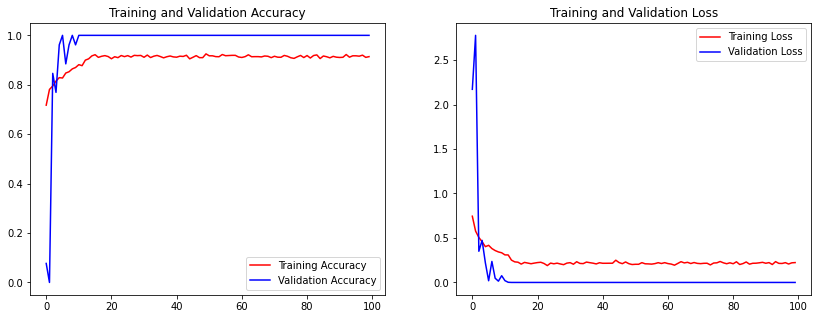

In [16]:
eval_plot(historyAlexnet, "AccLostAlexnetModel")

Found 2682 images belonging to 4 classes.


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.



Confusion Matrix AlexnetModel



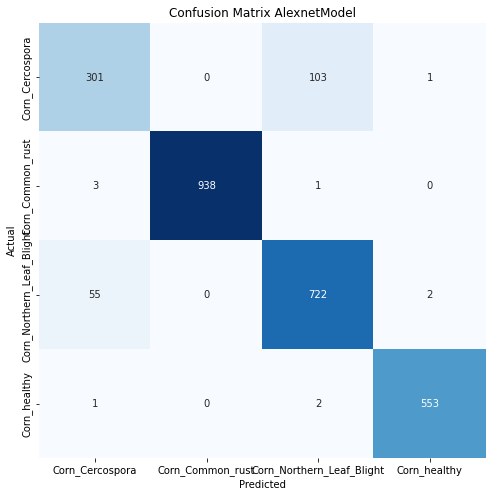



Classification Report

                           precision    recall  f1-score   support

          Corn_Cercospora       0.84      0.74      0.79       405
         Corn_Common_rust       1.00      1.00      1.00       942
Corn_Northern_Leaf_Blight       0.87      0.93      0.90       779
             Corn_healthy       0.99      0.99      0.99       556

                 accuracy                           0.94      2682
                macro avg       0.93      0.92      0.92      2682
             weighted avg       0.94      0.94      0.94      2682



In [17]:
evaluate(Alexnet, "AlexnetModel")

In [18]:
save_model(Alexnet, "AlexnetModel94")

Saved model to disk


### VGG16 Model

In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten, Dropout, Input
from tensorflow.keras.applications.vgg16 import VGG16

In [ ]:
baseModelvgg16 = VGG16(include_top=False, input_tensor=Input(shape=(SIZE, SIZE, 3)))
baseModelvgg16.summary()

58900480/58889256 [==============================] - 1s 0us/step
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                              

In [ ]:
class FCHeadNet:
  def build(baseModel, classes, D):
    headModel = baseModel.output
    headModel = Flatten(name="flatten")(headModel)
    headModel = Dense(D, activation='elu')(headModel)
    headModel = Dropout(0.5)(headModel)
    headModel = Dense(classes, activation='softmax')(headModel)
    return headModel

In [ ]:
headModel = FCHeadNet.build(baseModelvgg16, 4, 256)
modelvgg16 = Model(inputs= baseModelvgg16.input, outputs=headModel)

In [ ]:
for layer in baseModelvgg16.layers:
  layer.trainable = False

modelvgg16.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
modelvgg16.compile(
    optimizer = 'adam',
    loss = 'categorical_crossentropy',
    metrics = ['accuracy']
)

historyVgg16 = modelvgg16.fit(
    train_images,
    validation_data = val_images,
    batch_size=32,
    epochs = 100,
    callbacks = [
        tf.keras.callbacks.ReduceLROnPlateau(
            monitor='val_accuracy', 
            mode='max', 
            patience=5,  
            restore_best_weights=True
        )
    ]
)

Epoch 1/100
96/96 [==============================] - 63s 541ms/step - loss: 0.9629 - accuracy: 0.7592 - val_loss: 0.2527 - val_accuracy: 0.9227 - lr: 0.0010
Epoch 2/100
96/96 [==============================] - 47s 490ms/step - loss: 0.4141 - accuracy: 0.8574 - val_loss: 0.2263 - val_accuracy: 0.9185 - lr: 0.0010
Epoch 3/100
96/96 [==============================] - 47s 485ms/step - loss: 0.4112 - accuracy: 0.8443 - val_loss: 0.1784 - val_accuracy: 0.9313 - lr: 0.0010
Epoch 4/100
96/96 [==============================] - 47s 484ms/step - loss: 0.3345 - accuracy: 0.8732 - val_loss: 0.1054 - val_accuracy: 0.9614 - lr: 0.0010
Epoch 5/100
96/96 [==============================] - 47s 484ms/step - loss: 0.3497 - accuracy: 0.8752 - val_loss: 0.1287 - val_accuracy: 0.9657 - lr: 0.0010
Epoch 6/100
96/96 [==============================] - 47s 488ms/step - loss: 0.2681 - accuracy: 0.8896 - val_loss: 0.1138 - val_accuracy: 0.9614 - lr: 0.0010
Epoch 7/100
96/96 [==============================] - 46s 4

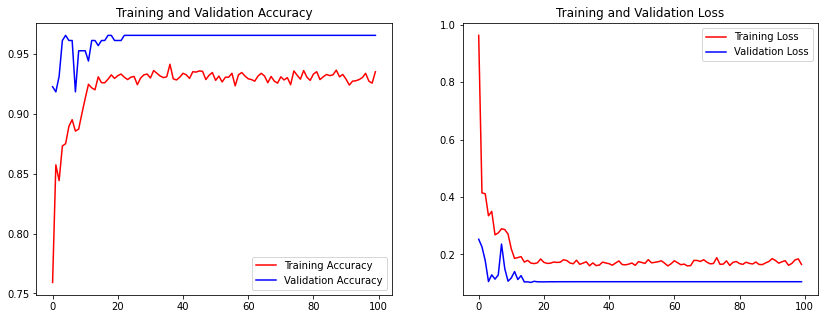

In [ ]:
eval_plot(historyVgg16, "AccLostVgg16Model")

Found 3044 images belonging to 4 classes.


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.



Confusion Matrix Vgg16Model



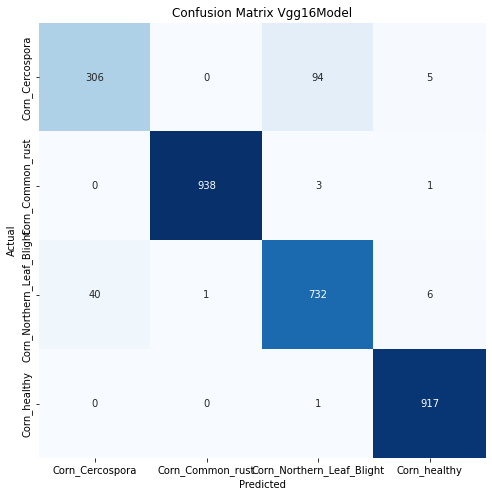



Classification Report

                           precision    recall  f1-score   support

          Corn_Cercospora       0.88      0.76      0.81       405
         Corn_Common_rust       1.00      1.00      1.00       942
Corn_Northern_Leaf_Blight       0.88      0.94      0.91       779
             Corn_healthy       0.99      1.00      0.99       918

                 accuracy                           0.95      3044
                macro avg       0.94      0.92      0.93      3044
             weighted avg       0.95      0.95      0.95      3044



In [ ]:
evaluate(modelvgg16, "Vgg16Model")

In [ ]:
save_model(modelvgg16, "Vgg16Model95")

Saved model to disk


### DenseNet Model

In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten, Dropout, Input
from tensorflow.keras.applications.densenet import DenseNet201

In [ ]:
baseModelDenseNet201 = DenseNet201(include_top=False, input_tensor=Input(shape=(SIZE, SIZE, 3)))
baseModelDenseNet201.summary()

74850304/74836368 [==============================] - 2s 0us/step
Model: "densenet201"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0          ['input_1[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (None, 112, 112, 64  9408        ['zero_padding2d[0][0]']         
                                )                                                                 
                       

In [ ]:
class FCHeadNet:
  def build(baseModel, classes, D):
    headModel = baseModel.output
    headModel = Flatten(name="flatten")(headModel)
    headModel = Dense(D, activation='elu')(headModel)
    headModel = Dropout(0.5)(headModel)
    headModel = Dense(classes, activation='softmax')(headModel)
    return headModel

In [ ]:
headModel = FCHeadNet.build(baseModelDenseNet201, 4, 256)
modelDenseNet201 = Model(inputs= baseModelDenseNet201.input, outputs=headModel)

In [ ]:
for layer in baseModelDenseNet201.layers:
  layer.trainable = False

modelDenseNet201.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0          ['input_1[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (None, 112, 112, 64  9408        ['zero_padding2d[0][0]']         
                                )                                                                 
                                                                                              

In [ ]:
modelDenseNet201.compile(
    optimizer = 'adam',
    loss = 'categorical_crossentropy',
    metrics = ['accuracy']
)

historyDenseNet201 = modelDenseNet201.fit(
    train_images,
    validation_data = val_images,
    batch_size=32,
    epochs = 100,
    callbacks = [
        tf.keras.callbacks.ReduceLROnPlateau(
            monitor='val_accuracy', 
            mode='max', 
            patience=5,  
            restore_best_weights=True
        )
    ]
)

Epoch 1/100
96/96 [==============================] - 84s 631ms/step - loss: 2.6625 - accuracy: 0.8196 - val_loss: 0.2234 - val_accuracy: 0.9099 - lr: 0.0010
Epoch 2/100
96/96 [==============================] - 52s 540ms/step - loss: 0.3338 - accuracy: 0.8804 - val_loss: 0.1445 - val_accuracy: 0.9442 - lr: 0.0010
Epoch 3/100
96/96 [==============================] - 52s 535ms/step - loss: 0.2855 - accuracy: 0.8962 - val_loss: 0.1470 - val_accuracy: 0.9485 - lr: 0.0010
Epoch 4/100
96/96 [==============================] - 51s 531ms/step - loss: 0.3379 - accuracy: 0.8936 - val_loss: 0.1557 - val_accuracy: 0.9313 - lr: 0.0010
Epoch 5/100
96/96 [==============================] - 51s 532ms/step - loss: 0.3454 - accuracy: 0.8886 - val_loss: 0.1503 - val_accuracy: 0.9485 - lr: 0.0010
Epoch 6/100
96/96 [==============================] - 51s 530ms/step - loss: 0.2901 - accuracy: 0.9011 - val_loss: 0.1432 - val_accuracy: 0.9485 - lr: 0.0010
Epoch 7/100
96/96 [==============================] - 51s 5

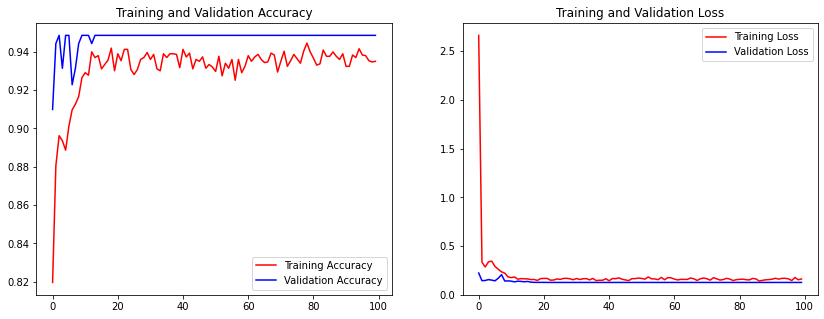

In [ ]:
eval_plot(historyDenseNet201, "AccLostDenseNet201Model")

Found 3044 images belonging to 4 classes.


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.



Confusion Matrix DenseNet201Model



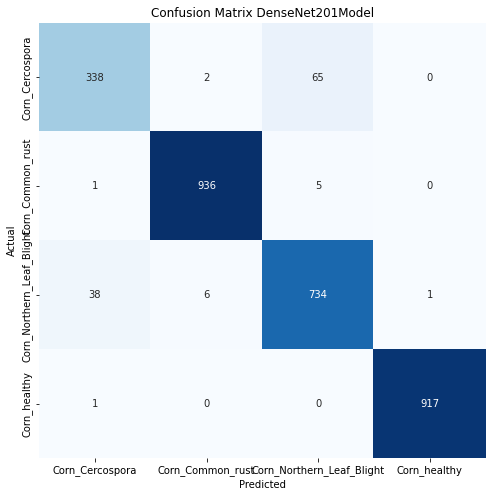



Classification Report

                           precision    recall  f1-score   support

          Corn_Cercospora       0.89      0.83      0.86       405
         Corn_Common_rust       0.99      0.99      0.99       942
Corn_Northern_Leaf_Blight       0.91      0.94      0.93       779
             Corn_healthy       1.00      1.00      1.00       918

                 accuracy                           0.96      3044
                macro avg       0.95      0.94      0.95      3044
             weighted avg       0.96      0.96      0.96      3044



In [ ]:
evaluate(modelDenseNet201, "DenseNet201Model")

In [ ]:
save_model(modelDenseNet201, "DenseNet201Model96")

Saved model to disk


### Xception Model

In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten, Dropout, Input
from tensorflow.keras.applications.xception import Xception

In [ ]:
baseModelXception = Xception(include_top=False, input_tensor=Input(shape=(SIZE, SIZE, 3)))
baseModelXception.summary()

83697664/83683744 [==============================] - 1s 0us/step
Model: "xception"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 111, 111, 32  864         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 111, 111, 32  128        ['block1_conv1[0][0]']           
 ation)                   

In [ ]:
class FCHeadNet:
  def build(baseModel, classes, D):
    headModel = baseModel.output
    headModel = Flatten(name="flatten")(headModel)
    headModel = Dense(D, activation='elu')(headModel)
    headModel = Dropout(0.5)(headModel)
    headModel = Dense(classes, activation='softmax')(headModel)
    return headModel

In [ ]:
headModel = FCHeadNet.build(baseModelXception, 4, 256)
modelXception = Model(inputs= baseModelXception.input, outputs=headModel)

In [ ]:
for layer in baseModelXception.layers:
  layer.trainable = False

modelXception.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 111, 111, 32  864         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 111, 111, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                                                           

In [ ]:
modelXception.compile(
    optimizer = 'adam',
    loss = 'categorical_crossentropy',
    metrics = ['accuracy']
)

historyXception = modelXception.fit(
    train_images,
    validation_data = val_images,
    batch_size=32,
    epochs = 100,
    callbacks = [
        tf.keras.callbacks.ReduceLROnPlateau(
            monitor='val_accuracy', 
            mode='max', 
            patience=5,  
            restore_best_weights=True
        )
    ]
)

Epoch 1/100
96/96 [==============================] - 60s 568ms/step - loss: 3.3860 - accuracy: 0.7838 - val_loss: 0.3250 - val_accuracy: 0.8712 - lr: 0.0010
Epoch 2/100
96/96 [==============================] - 53s 550ms/step - loss: 0.4651 - accuracy: 0.8472 - val_loss: 0.2442 - val_accuracy: 0.9013 - lr: 0.0010
Epoch 3/100
96/96 [==============================] - 52s 539ms/step - loss: 0.4623 - accuracy: 0.8403 - val_loss: 0.4365 - val_accuracy: 0.8541 - lr: 0.0010
Epoch 4/100
96/96 [==============================] - 51s 526ms/step - loss: 0.4733 - accuracy: 0.8489 - val_loss: 0.3034 - val_accuracy: 0.8755 - lr: 0.0010
Epoch 5/100
96/96 [==============================] - 51s 530ms/step - loss: 0.4044 - accuracy: 0.8604 - val_loss: 0.2541 - val_accuracy: 0.8970 - lr: 0.0010
Epoch 6/100
96/96 [==============================] - 51s 529ms/step - loss: 0.3851 - accuracy: 0.8660 - val_loss: 0.2908 - val_accuracy: 0.9056 - lr: 0.0010
Epoch 7/100
96/96 [==============================] - 51s 5

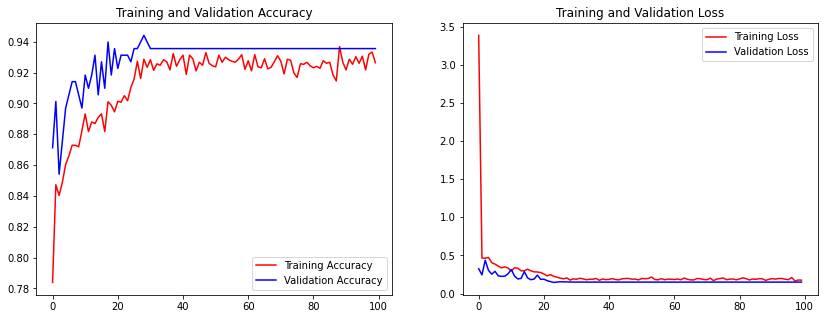

In [ ]:
eval_plot(historyXception, "AccLostXceptionModel")

Found 3044 images belonging to 4 classes.


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.



Confusion Matrix XceptionModel



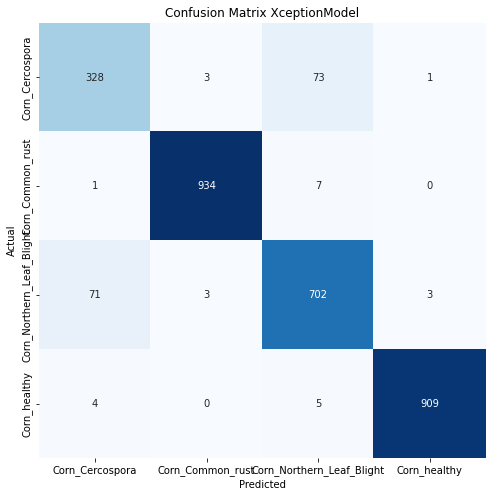



Classification Report

                           precision    recall  f1-score   support

          Corn_Cercospora       0.81      0.81      0.81       405
         Corn_Common_rust       0.99      0.99      0.99       942
Corn_Northern_Leaf_Blight       0.89      0.90      0.90       779
             Corn_healthy       1.00      0.99      0.99       918

                 accuracy                           0.94      3044
                macro avg       0.92      0.92      0.92      3044
             weighted avg       0.94      0.94      0.94      3044



In [ ]:
evaluate(modelXception, "XceptionModel")

In [ ]:
save_model(modelXception, "XceptionModel94")

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


Saved model to disk


### MobileNetV2 Model

In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten, Dropout, Input
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2

In [ ]:
baseModelMobileNetV2 = MobileNetV2(include_top=False, input_tensor=Input(shape=(SIZE, SIZE, 3)))
baseModelMobileNetV2.summary()

Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                              

In [ ]:
class FCHeadNet:
  def build(baseModel, classes, D):
    headModel = baseModel.output
    headModel = Flatten(name="flatten")(headModel)
    headModel = Dense(D, activation='elu')(headModel)
    headModel = Dropout(0.5)(headModel)
    headModel = Dense(classes, activation='softmax')(headModel)
    return headModel

In [ ]:
headModel = FCHeadNet.build(baseModelMobileNetV2, 4, 256)
modelMobileNetV2 = Model(inputs= baseModelMobileNetV2.input, outputs=headModel)

In [ ]:
for layer in baseModelMobileNetV2.layers:
  layer.trainable = False

modelMobileNetV2.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                           

In [ ]:
modelMobileNetV2.compile(
    optimizer = 'adam',
    loss = 'categorical_crossentropy',
    metrics = ['accuracy']
)

historyMobileNetV2 = modelMobileNetV2.fit(
    train_images,
    validation_data = val_images,
    batch_size=32,
    epochs = 100,
    callbacks = [
        tf.keras.callbacks.ReduceLROnPlateau(
            monitor='val_accuracy', 
            mode='max', 
            patience=5,  
            restore_best_weights=True
        )
    ]
)

Epoch 1/100
84/84 [==============================] - 40s 443ms/step - loss: 3.0456 - accuracy: 0.7979 - val_loss: 0.1198 - val_accuracy: 0.9615 - lr: 0.0010
Epoch 2/100
84/84 [==============================] - 37s 441ms/step - loss: 0.4438 - accuracy: 0.8591 - val_loss: 0.1155 - val_accuracy: 0.9615 - lr: 0.0010
Epoch 3/100
84/84 [==============================] - 37s 438ms/step - loss: 0.4242 - accuracy: 0.8639 - val_loss: 0.1769 - val_accuracy: 0.9615 - lr: 0.0010
Epoch 4/100
84/84 [==============================] - 37s 442ms/step - loss: 0.3811 - accuracy: 0.8755 - val_loss: 0.0392 - val_accuracy: 0.9615 - lr: 0.0010
Epoch 5/100
84/84 [==============================] - 37s 437ms/step - loss: 0.3720 - accuracy: 0.8706 - val_loss: 0.2690 - val_accuracy: 0.9615 - lr: 0.0010
Epoch 6/100
84/84 [==============================] - 37s 434ms/step - loss: 0.3512 - accuracy: 0.8818 - val_loss: 0.1293 - val_accuracy: 0.9615 - lr: 0.0010
Epoch 7/100
84/84 [==============================] - 36s 4

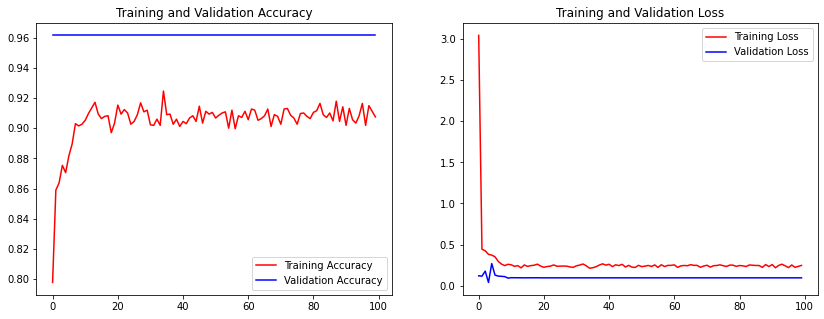

In [ ]:
eval_plot(historyMobileNetV2, "AccLostMobileNetV2Model")

Found 2682 images belonging to 4 classes.


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.



Confusion Matrix MobileNetV2Model



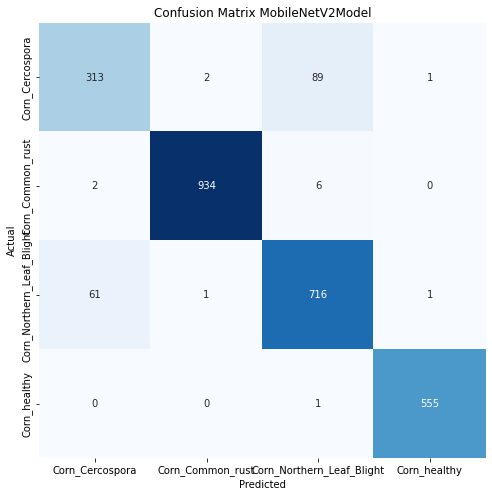



Classification Report

                           precision    recall  f1-score   support

          Corn_Cercospora       0.83      0.77      0.80       405
         Corn_Common_rust       1.00      0.99      0.99       942
Corn_Northern_Leaf_Blight       0.88      0.92      0.90       779
             Corn_healthy       1.00      1.00      1.00       556

                 accuracy                           0.94      2682
                macro avg       0.93      0.92      0.92      2682
             weighted avg       0.94      0.94      0.94      2682



In [ ]:
evaluate(modelMobileNetV2, "MobileNetV2Model")

In [ ]:
save_model(modelMobileNetV2, "MobileNetV2Model94")

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


Saved model to disk


### InceptionResNetV2 Model

In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten, Dropout, Input
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2

In [ ]:
baseModelInceptionResNetV2 = InceptionResNetV2(include_top=False, input_tensor=Input(shape=(SIZE, SIZE, 3)))
baseModelInceptionResNetV2.summary()

219070464/219055592 [==============================] - 6s 0us/step
Model: "inception_resnet_v2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 111, 111, 32  864         ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 111, 111, 32  96         ['conv2d[0][0]']                 
 alization)  

In [ ]:
class FCHeadNet:
  def build(baseModel, classes, D):
    headModel = baseModel.output
    headModel = Flatten(name="flatten")(headModel)
    headModel = Dense(D, activation='elu')(headModel)
    headModel = Dropout(0.5)(headModel)
    headModel = Dense(classes, activation='softmax')(headModel)
    return headModel

In [ ]:
headModel = FCHeadNet.build(baseModelInceptionResNetV2, 4, 256)
modelInceptionResNetV2 = Model(inputs= baseModelInceptionResNetV2.input, outputs=headModel)

In [ ]:
for layer in baseModelInceptionResNetV2.layers:
  layer.trainable = False

modelInceptionResNetV2.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 111, 111, 32  864         ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 111, 111, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                                           

In [ ]:
modelInceptionResNetV2.compile(
    optimizer = 'adam',
    loss = 'categorical_crossentropy',
    metrics = ['accuracy']
)

historyInceptionResNetV2 = modelInceptionResNetV2.fit(
    train_images,
    validation_data = val_images,
    batch_size=32,
    epochs = 100,
    callbacks = [
        tf.keras.callbacks.ReduceLROnPlateau(
            monitor='val_accuracy', 
            mode='max', 
            patience=5,  
            restore_best_weights=True
        )
    ]
)

Epoch 1/100
84/84 [==============================] - 66s 591ms/step - loss: 3.2713 - accuracy: 0.7386 - val_loss: 0.0161 - val_accuracy: 1.0000 - lr: 0.0010
Epoch 2/100
84/84 [==============================] - 45s 535ms/step - loss: 0.5371 - accuracy: 0.7957 - val_loss: 0.0062 - val_accuracy: 1.0000 - lr: 0.0010
Epoch 3/100
84/84 [==============================] - 45s 536ms/step - loss: 0.5002 - accuracy: 0.8177 - val_loss: 3.4539e-04 - val_accuracy: 1.0000 - lr: 0.0010
Epoch 4/100
84/84 [==============================] - 45s 537ms/step - loss: 0.5059 - accuracy: 0.8072 - val_loss: 0.1226 - val_accuracy: 0.9231 - lr: 0.0010
Epoch 5/100
84/84 [==============================] - 45s 535ms/step - loss: 0.5263 - accuracy: 0.8177 - val_loss: 1.2978e-05 - val_accuracy: 1.0000 - lr: 0.0010
Epoch 6/100
84/84 [==============================] - 46s 542ms/step - loss: 0.5557 - accuracy: 0.8039 - val_loss: 0.0738 - val_accuracy: 0.9615 - lr: 0.0010
Epoch 7/100
84/84 [==============================]

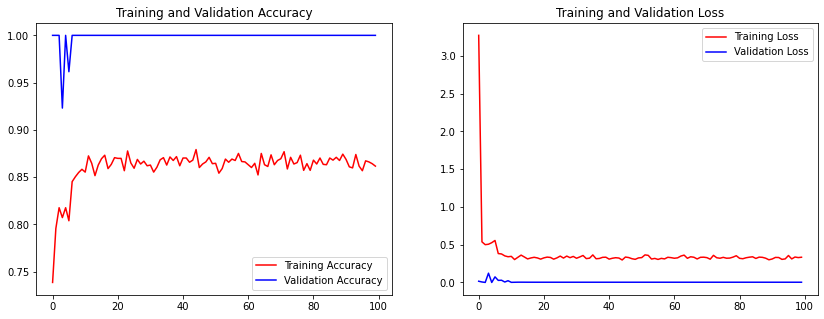

In [ ]:
eval_plot(historyInceptionResNetV2, "AccLostInceptionResNetV2Model")

Found 2682 images belonging to 4 classes.


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.



Confusion Matrix InceptionResNetV2Model



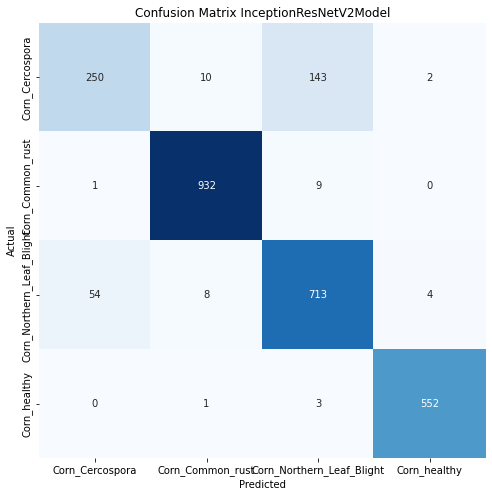



Classification Report

                           precision    recall  f1-score   support

          Corn_Cercospora       0.82      0.62      0.70       405
         Corn_Common_rust       0.98      0.99      0.98       942
Corn_Northern_Leaf_Blight       0.82      0.92      0.87       779
             Corn_healthy       0.99      0.99      0.99       556

                 accuracy                           0.91      2682
                macro avg       0.90      0.88      0.89      2682
             weighted avg       0.91      0.91      0.91      2682



In [ ]:
evaluate(modelInceptionResNetV2, "InceptionResNetV2Model")

In [ ]:
save_model(modelInceptionResNetV2, "InceptionResNetV2Model91")

Saved model to disk


### ResNet152V2 Model

In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten, Dropout, Input
from tensorflow.keras.applications.resnet_v2 import ResNet152V2

In [ ]:
baseModelResNet152V2 = ResNet152V2(include_top=False, input_tensor=Input(shape=(SIZE, SIZE, 3)))
baseModelResNet152V2.summary()

234561536/234545216 [==============================] - 2s 0us/step
Model: "resnet152v2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                     

In [ ]:
class FCHeadNet:
  def build(baseModel, classes, D):
    headModel = baseModel.output
    headModel = Flatten(name="flatten")(headModel)
    headModel = Dense(D, activation='elu')(headModel)
    headModel = Dropout(0.5)(headModel)
    headModel = Dense(classes, activation='softmax')(headModel)
    return headModel

In [ ]:
headModel = FCHeadNet.build(baseModelResNet152V2, 4, 256)
modelResNet152V2 = Model(inputs= baseModelResNet152V2.input, outputs=headModel)

In [ ]:
for layer in baseModelResNet152V2.layers:
  layer.trainable = False

modelResNet152V2.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

In [ ]:
modelResNet152V2.compile(
    optimizer = 'adam',
    loss = 'categorical_crossentropy',
    metrics = ['accuracy']
)

historyResNet152V2 = modelResNet152V2.fit(
    train_images,
    validation_data = val_images,
    batch_size=32,
    epochs = 100,
    callbacks = [
        tf.keras.callbacks.ReduceLROnPlateau(
            monitor='val_accuracy', 
            mode='max', 
            patience=5,  
            restore_best_weights=True
        )
    ]
)

Epoch 1/100
84/84 [==============================] - 75s 653ms/step - loss: 3.5924 - accuracy: 0.8341 - val_loss: 7.3560e-05 - val_accuracy: 1.0000 - lr: 0.0010
Epoch 2/100
84/84 [==============================] - 50s 588ms/step - loss: 0.5756 - accuracy: 0.8743 - val_loss: 0.0014 - val_accuracy: 1.0000 - lr: 0.0010
Epoch 3/100
84/84 [==============================] - 49s 585ms/step - loss: 0.5111 - accuracy: 0.8568 - val_loss: 0.0075 - val_accuracy: 1.0000 - lr: 0.0010
Epoch 4/100
84/84 [==============================] - 50s 588ms/step - loss: 0.3568 - accuracy: 0.8881 - val_loss: 1.3755e-08 - val_accuracy: 1.0000 - lr: 0.0010
Epoch 5/100
84/84 [==============================] - 49s 584ms/step - loss: 0.4131 - accuracy: 0.8729 - val_loss: 0.0000e+00 - val_accuracy: 1.0000 - lr: 0.0010
Epoch 6/100
84/84 [==============================] - 49s 584ms/step - loss: 0.3382 - accuracy: 0.8945 - val_loss: 0.1251 - val_accuracy: 0.9615 - lr: 0.0010
Epoch 7/100
84/84 [===========================

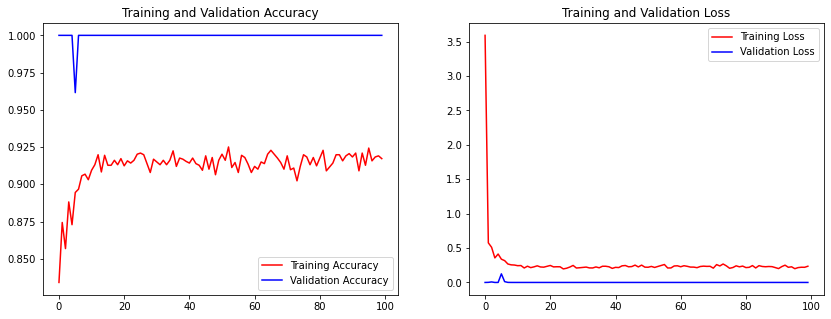

In [ ]:
eval_plot(historyResNet152V2, "AccLostResNet152V2Model")

Found 2682 images belonging to 4 classes.


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.



Confusion Matrix ResNet152V2Model



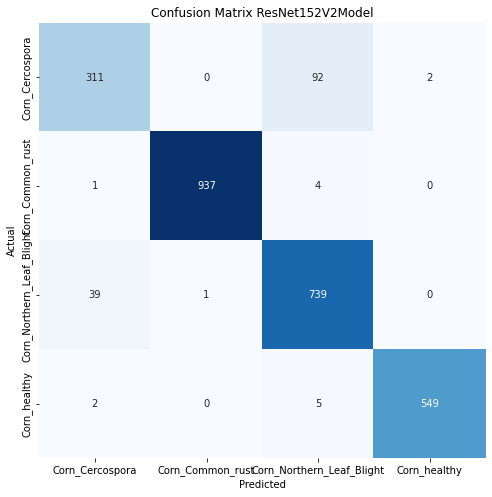



Classification Report

                           precision    recall  f1-score   support

          Corn_Cercospora       0.88      0.77      0.82       405
         Corn_Common_rust       1.00      0.99      1.00       942
Corn_Northern_Leaf_Blight       0.88      0.95      0.91       779
             Corn_healthy       1.00      0.99      0.99       556

                 accuracy                           0.95      2682
                macro avg       0.94      0.92      0.93      2682
             weighted avg       0.95      0.95      0.94      2682



In [ ]:
evaluate(modelResNet152V2, "ResNet152V2Model")

In [ ]:
save_model(modelResNet152V2, "ResNet152V2Model95")

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


Saved model to disk


### Alexnet Hyparam Optimizer


In [ ]:
import tensorflow as tf
from tensorboard.plugins.hparams import api as hp
from tensorflow.keras import Model, models

In [ ]:
%load_ext tensorboard

In [ ]:
HP_OPTIMIZER = hp.HParam('optimizer', hp.Discrete(['adam', 'sgd', 'RMSprop']))
HP_BATCH_SIZE = hp.HParam('batch_size', hp.Discrete([32, 64, 128]))

METRIC_ACCURACY = 'accuracy'

with tf.summary.create_file_writer('logs/hparam_tuning').as_default():
  hp.hparams_config(
    hparams=[HP_OPTIMIZER, HP_BATCH_SIZE],
    metrics=[hp.Metric(METRIC_ACCURACY, display_name='Accuracy')],
  )

In [ ]:
xvl, yvl = zip(*(val_images[i] for i in range(len(val_images))))
x_val, y_val = np.vstack(xvl), np.vstack(yvl)

In [ ]:
def train_test_model(hparams):
  model = models.Sequential()

  model.add(layers.InputLayer(input_shape=[SIZE,SIZE,3]))
  model.add(layers.Conv2D(filters = 96, kernel_size = (11, 11), strides = (4, 4), padding = 'same'))
  model.add(layers.Activation('relu'))
  model.add(layers.MaxPooling2D(pool_size = (2, 2), strides = (2, 2), padding = 'same'))
  model.add(layers.BatchNormalization())
  model.add(layers.Conv2D(filters = 256, kernel_size = (11, 11), strides = (1, 1), padding = 'same'))
  model.add(layers.Activation('relu'))
  model.add(layers.MaxPooling2D(pool_size = (2, 2), strides = (2, 2),  padding = 'same'))
  model.add(layers.BatchNormalization())
  model.add(layers.Conv2D(filters = 384, kernel_size = (3, 3), strides = (1, 1), padding = 'same'))
  model.add(layers.Activation('relu'))
  model.add(layers.BatchNormalization()) 
  model.add(layers.Conv2D(filters = 384, kernel_size = (3, 3), strides = (1, 1), padding = 'same'))
  model.add(layers.Activation('relu'))
  model.add(layers.BatchNormalization()) 
  model.add(layers.Conv2D(filters = 256, kernel_size = (3, 3), strides = (1, 1), padding = 'same'))
  model.add(layers.Activation('relu'))
  model.add(layers.MaxPooling2D(pool_size = (2, 2), strides = (2, 2), padding = 'same'))
  model.add(layers.BatchNormalization()) 
  model.add(layers.Flatten())
  model.add(layers.Dense(4096, input_shape = (SIZE*SIZE*3, )))
  model.add(layers.Activation('relu'))
  model.add(layers.Dropout(0.5))
  model.add(layers.BatchNormalization())
  model.add(layers.Dense(4096))
  model.add(layers.Activation('relu'))
  model.add(layers.Dropout(0.5))
  model.add(layers.BatchNormalization())
  model.add(layers.Dense(4, activation = 'softmax'))
  # model.compile(
  #     optimizer=hparams[HP_OPTIMIZER],
  #     loss='categorical_crossentropy',
  #     metrics=['accuracy'],
  # )
  model.compile(loss='categorical_crossentropy', optimizer=hparams[HP_OPTIMIZER], metrics=['accuracy'])

  model.fit(train_images, 
            validation_data=val_images, 
            epochs = 20,
            batch_size = hparams[HP_BATCH_SIZE],
            callbacks = [
                tf.keras.callbacks.ReduceLROnPlateau(
                    monitor='val_loss',
                    factor=0.5,
                    patience=40,
                    verbose=1,
                    mode='auto',
                    cooldown=1
                )
            ]
            )
  _, accuracy = model.evaluate(x_val, y_val)


  return accuracy

In [ ]:
def run(run_dir, hparams):
  with tf.summary.create_file_writer(run_dir).as_default():
    hp.hparams(hparams)  # record the values used in this trial
    accuracy = train_test_model(hparams)
    tf.summary.scalar(METRIC_ACCURACY, accuracy, step=50)

In [ ]:
session_num = 0

for optimizer in HP_OPTIMIZER.domain.values:
  for batch_size in HP_BATCH_SIZE.domain.values:
    hparams = {
        HP_OPTIMIZER: optimizer,
        HP_BATCH_SIZE: batch_size,
    }
    run_name = "run-%d" % session_num
    print('--- Starting trial: %s' % run_name)
    print({h.name: hparams[h] for h in hparams})
    run('logs/hparam_tuning/' + run_name, hparams)
    session_num += 1

--- Starting trial: run-0
{'optimizer': 'RMSprop', 'batch_size': 32}
Epoch 1/20
84/84 [==============================] - 63s 541ms/step - loss: 1.3477 - accuracy: 0.7028 - val_loss: 0.0000e+00 - val_accuracy: 1.0000 - lr: 0.0010
Epoch 2/20
84/84 [==============================] - 55s 656ms/step - loss: 0.7340 - accuracy: 0.7688 - val_loss: 157.2131 - val_accuracy: 0.0000e+00 - lr: 0.0010
Epoch 3/20
84/84 [==============================] - 42s 494ms/step - loss: 0.6461 - accuracy: 0.7740 - val_loss: 2.0736 - val_accuracy: 0.8077 - lr: 0.0010
Epoch 4/20
84/84 [==============================] - 44s 524ms/step - loss: 0.5998 - accuracy: 0.8001 - val_loss: 2.2544 - val_accuracy: 0.6538 - lr: 0.0010
Epoch 5/20
84/84 [==============================] - 41s 491ms/step - loss: 0.5226 - accuracy: 0.8136 - val_loss: 1.8279e-04 - val_accuracy: 1.0000 - lr: 0.0010
Epoch 6/20
84/84 [==============================] - 41s 485ms/step - loss: 0.4806 - accuracy: 0.8225 - val_loss: 0.1478 - val_accuracy: 0

In [ ]:
%%bash
wget -q 'https://storage.googleapis.com/download.tensorflow.org/tensorboard/hparams_demo_logs.zip'
unzip -q hparams_demo_logs.zip -d logs/hparam_demo

In [ ]:
%tensorboard --logdir logs/hparam_tuning

<IPython.core.display.Javascript object>

In [ ]:
shutil.move("/content/logs", "/content/drive/MyDrive/dataku/Dataset/hparam")
# shutil.move("/content/drive/MyDrive/dataku/Dataset/hparam/logs", "/content")

### AlexnetHprm Model

In [19]:
from tensorflow.keras import layers
from tensorflow.keras import Model, models
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, BatchNormalization, Dropout
import tensorflow as tf
from tensorflow import keras

AlexnetHprm = models.Sequential()

AlexnetHprm.add(layers.InputLayer(input_shape=[SIZE,SIZE,3]))
AlexnetHprm.add(layers.Conv2D(filters = 96, kernel_size = (11, 11), strides = (4, 4), padding = 'same'))
AlexnetHprm.add(layers.Activation('relu'))
AlexnetHprm.add(layers.MaxPooling2D(pool_size = (2, 2), strides = (2, 2), padding = 'same'))
AlexnetHprm.add(layers.BatchNormalization())
AlexnetHprm.add(layers.Conv2D(filters = 256, kernel_size = (11, 11), strides = (1, 1), padding = 'same'))
AlexnetHprm.add(layers.Activation('relu'))
AlexnetHprm.add(layers.MaxPooling2D(pool_size = (2, 2), strides = (2, 2),  padding = 'same'))
AlexnetHprm.add(layers.BatchNormalization())
AlexnetHprm.add(layers.Conv2D(filters = 384, kernel_size = (3, 3), strides = (1, 1), padding = 'same'))
AlexnetHprm.add(layers.Activation('relu'))
AlexnetHprm.add(layers.BatchNormalization()) 
AlexnetHprm.add(layers.Conv2D(filters = 384, kernel_size = (3, 3), strides = (1, 1), padding = 'same'))
AlexnetHprm.add(layers.Activation('relu'))
AlexnetHprm.add(layers.BatchNormalization()) 
AlexnetHprm.add(layers.Conv2D(filters = 256, kernel_size = (3, 3), strides = (1, 1), padding = 'same'))
AlexnetHprm.add(layers.Activation('relu'))
AlexnetHprm.add(layers.MaxPooling2D(pool_size = (2, 2), strides = (2, 2), padding = 'same'))
AlexnetHprm.add(layers.BatchNormalization()) 
AlexnetHprm.add(layers.Flatten())
AlexnetHprm.add(layers.Dense(4096, input_shape = (SIZE*SIZE*3, )))
AlexnetHprm.add(layers.Activation('relu'))
AlexnetHprm.add(layers.Dropout(0.5))
AlexnetHprm.add(layers.BatchNormalization())
AlexnetHprm.add(layers.Dense(4096))
AlexnetHprm.add(layers.Activation('relu'))
AlexnetHprm.add(layers.Dropout(0.5))
AlexnetHprm.add(layers.BatchNormalization())
AlexnetHprm.add(layers.Dense(4, activation = 'softmax'))

AlexnetHprm.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 56, 56, 96)        34944     
                                                                 
 activation_14 (Activation)  (None, 56, 56, 96)        0         
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 28, 28, 96)       0         
 2D)                                                             
                                                                 
 batch_normalization_14 (Bat  (None, 28, 28, 96)       384       
 chNormalization)                                                
                                                                 
 conv2d_11 (Conv2D)          (None, 28, 28, 256)       2973952   
                                                                 
 activation_15 (Activation)  (None, 28, 28, 256)      

In [20]:
AlexnetHprm.compile(
    optimizer = 'RMSprop',
    loss = 'categorical_crossentropy',
    metrics = ['accuracy']
)

historyAlexnetHprm = AlexnetHprm.fit(
    train_images,
    validation_data = val_images,
    batch_size=64,
    epochs = 100,
    callbacks = [
        tf.keras.callbacks.ReduceLROnPlateau(
            monitor='val_accuracy', 
            mode='max', 
            patience=5,  
            restore_best_weights=True
        )
    ]
)


Epoch 1/100
84/84 [==============================] - 42s 471ms/step - loss: 1.4238 - accuracy: 0.6999 - val_loss: 34.2805 - val_accuracy: 0.3846 - lr: 0.0010
Epoch 2/100
84/84 [==============================] - 40s 478ms/step - loss: 0.7023 - accuracy: 0.7666 - val_loss: 0.0503 - val_accuracy: 0.9615 - lr: 0.0010
Epoch 3/100
84/84 [==============================] - 41s 484ms/step - loss: 0.6192 - accuracy: 0.7916 - val_loss: 8.5916 - val_accuracy: 0.6538 - lr: 0.0010
Epoch 4/100
84/84 [==============================] - 40s 472ms/step - loss: 0.5506 - accuracy: 0.8113 - val_loss: 0.0091 - val_accuracy: 1.0000 - lr: 0.0010
Epoch 5/100
84/84 [==============================] - 40s 475ms/step - loss: 0.4900 - accuracy: 0.8244 - val_loss: 2.0022 - val_accuracy: 0.5769 - lr: 0.0010
Epoch 6/100
84/84 [==============================] - 39s 465ms/step - loss: 0.4252 - accuracy: 0.8542 - val_loss: 0.0685 - val_accuracy: 0.9231 - lr: 0.0010
Epoch 7/100
84/84 [==============================] - 41s 

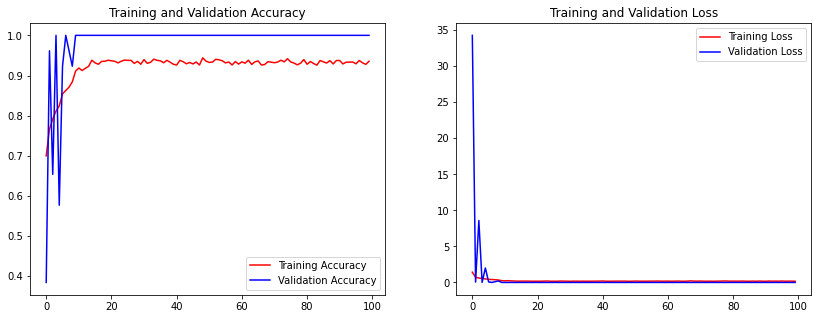

In [21]:
eval_plot(historyAlexnetHprm, "AccLostAlexnetHprmModel")

Found 2682 images belonging to 4 classes.


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.



Confusion Matrix AlexnetHprmModel



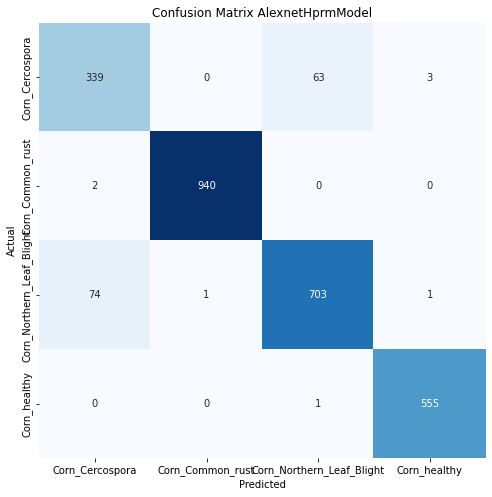



Classification Report

                           precision    recall  f1-score   support

          Corn_Cercospora       0.82      0.84      0.83       405
         Corn_Common_rust       1.00      1.00      1.00       942
Corn_Northern_Leaf_Blight       0.92      0.90      0.91       779
             Corn_healthy       0.99      1.00      1.00       556

                 accuracy                           0.95      2682
                macro avg       0.93      0.93      0.93      2682
             weighted avg       0.95      0.95      0.95      2682



In [22]:
evaluate(AlexnetHprm, "AlexnetHprmModel")

In [23]:
save_model(AlexnetHprm, "AlexnetHprmModel95")

Saved model to disk


### Test